# Disclaimer

Aprovechando las carácteristicas de Google Colaboratory y Jupyter notebook, en vez de hacer una única función que procesara una imágen en particular, se ha decidido ejecutar el código parte por parte para todas las imágenes entregadas en los archivos de la tarea, con fines explicativos.

Se mencionó en clases que la ejecución debe ser no más de 5 minutos por imágen, tiempo conseguido ya que al ser 6 imágenes el tiempo máximo de ejecución es de 30 minutos y este programa se demora como 15 en ejecutarse en su totalidad. 

El código y la ejecución se trabaja en forma de que se entienda el proceso y lo que se deseaba lograr en la totalidad, es por eso que al final de todo se podrá encontrar una función que resuma todo el proceso y puede llamarse para ejecutar imágen por imágen en caso de que quiera comprobar la solución sin ejecutar todo el archivo.

## Importar Librerias

Se hace suso de las 3 librerias indicadas en clases más funciones de *math* para el cálculo algebráico de la hora.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from cv2 import imread
from google.colab.patches import cv2_imshow
from math import sqrt, ceil, floor, pi, modf

## Carga de imágenes

Es necesarios tenerlas en la carpeta de ejecución

In [2]:
Original_img = [imread('IMG_649{}.jpg'.format(i)) for i in range(6)]

## Separación por canales

Deseamos encontrar la mejor opción entre los canales de una imágen para poder decidir con cuál de ellas trabajar.

imagen 0:
size =  (4032, 3024, 3)
max  =  255
min  =  0


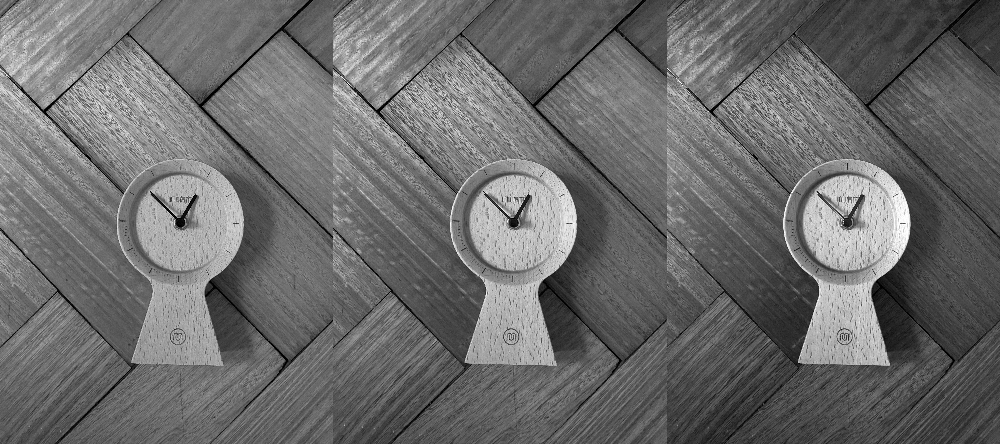

In [3]:
def howIs(img):
  print('size = ',img.shape)
  print('max  = ',np.max(img))
  print('min  = ',np.min(img))

def canalSel(img, canal):
  return img[:,:,canal]

def rgb_img(Img):
  I = Img.copy()
  I = I[:,:,[2,1,0]]
  R = I[:,:,0]
  G = I[:,:,1]
  B = I[:,:,2]
  RGB = np.concatenate((R,G,B), axis=1)
  return RGB

print("imagen 0:")
howIs(Original_img[0])
cv2_imshow(rgb_img(Original_img[0]))

# Segmentación de canales

imagen 0:


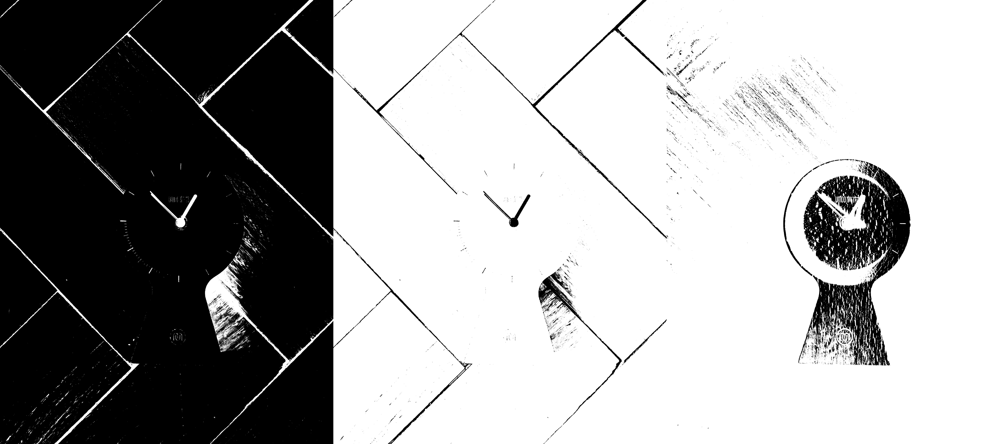

imagen 1:


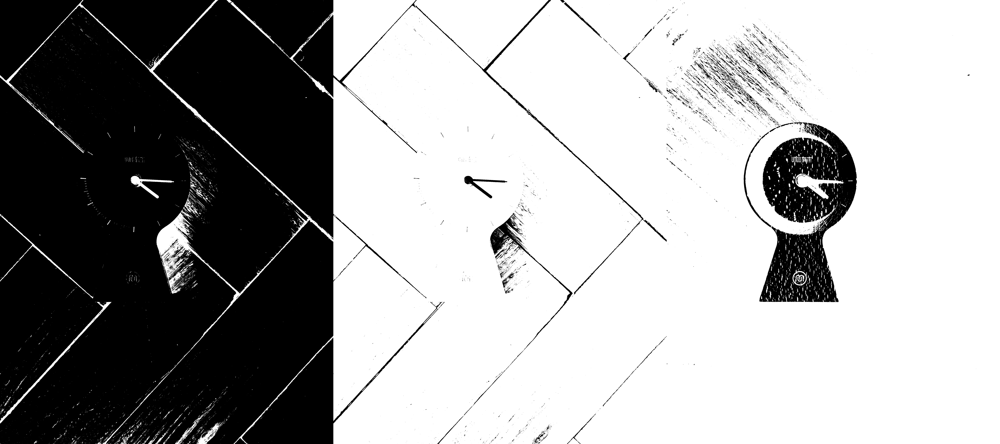

imagen 2:


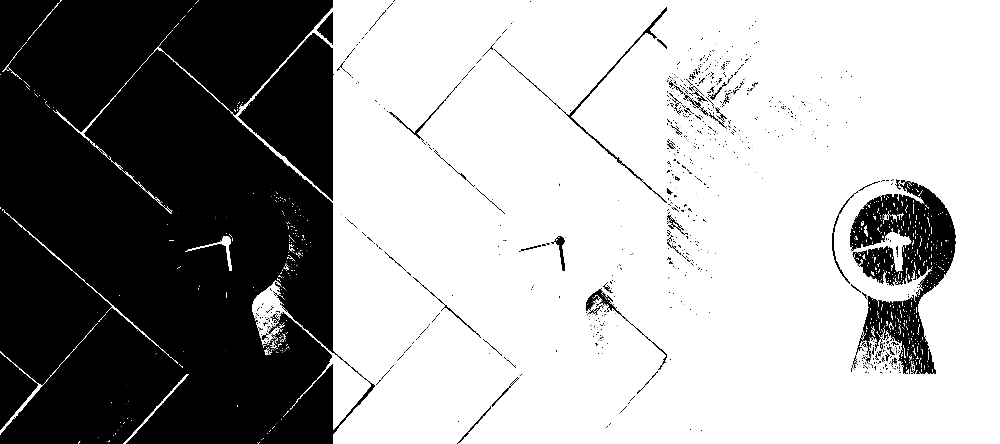

imagen 3:


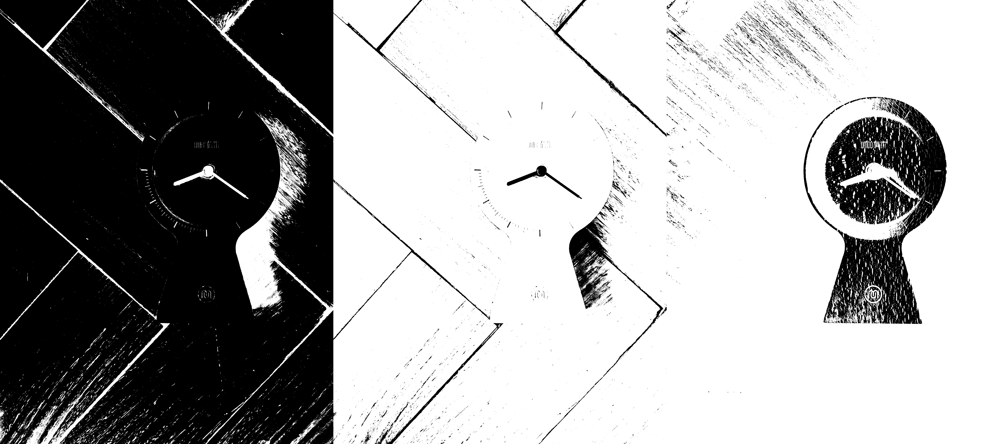

imagen 4:


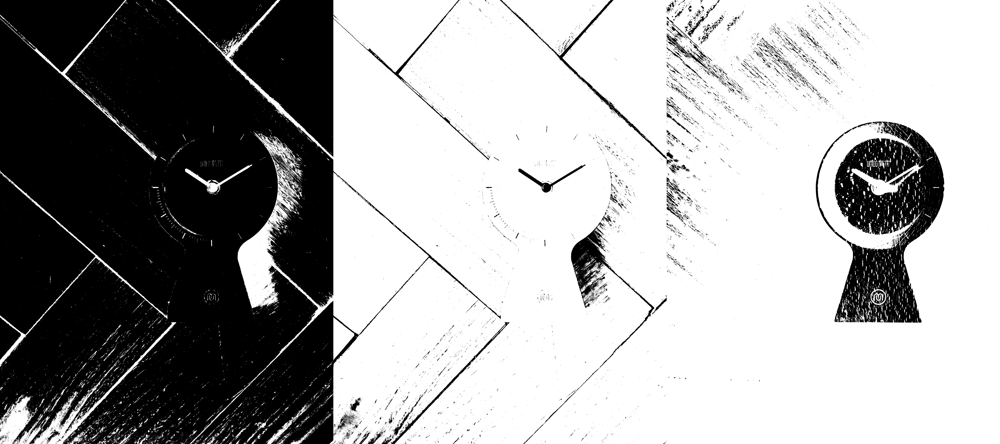

imagen 5:


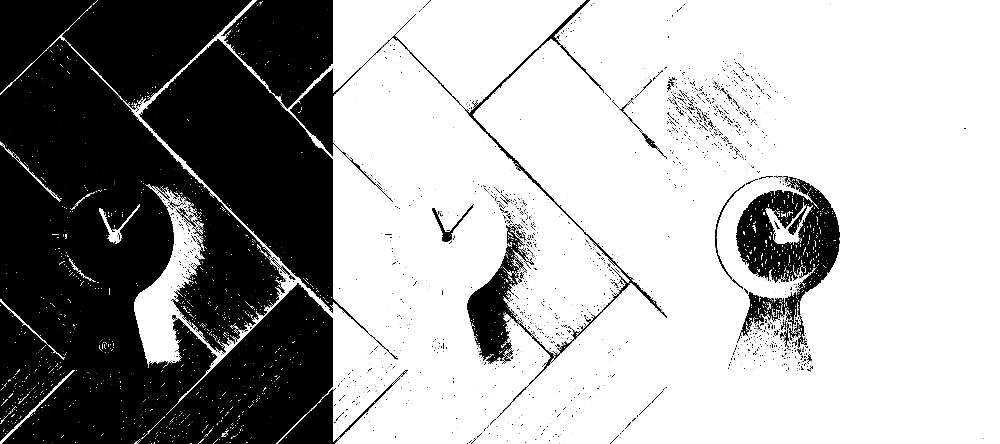

In [4]:
def segmenta(img, t):
  (N,M) = img.shape
  Y = np.zeros((N,M))
  for i in range(N):
    for j in range(M):
      if img[i,j] > t:
        Y[i,j] = 255
  return Y

def canalSel(img,i):
  copia = img.copy() 
  return copia[:,:,i]

def voltear(X):
  (N,M) = X.shape
  Xm = np.zeros((N,M), np.uint8)
  for j in range(M):
    for i in range(N):
      Xm[i,j] = 255 - X[i,j]
  return Xm

img_c2 = [canalSel(img, 2) for img in Original_img] # R
img_c1 = [canalSel(img, 1) for img in Original_img] # G
img_c0 = [canalSel(img, 0) for img in Original_img] # B

IMG_Rv = []
IMG_Gv = []
IMG_Bv = []

i = 0
for i in range(len(img_c1)):
  print("imagen {}:".format(i))         # BEST
  Rv = segmenta(voltear(img_c2[i]), 193) #200 193
  Gv = segmenta(img_c1[i], 40)           #100? 175?
  Bv = segmenta(voltear(img_c0[i]),75)   #75
  IMG_Rv.append(Rv)
  IMG_Gv.append(Gv)
  IMG_Bv.append(Bv)
  RGBv = np.concatenate((Rv,Gv,Bv), axis=1)
  cv2_imshow(RGBv)

## Limpieza de imágenes - En búsqueda del reloj

Debido a las lineas de la madera, preferimos las imágenes resultantes del canal azul.

In [5]:
# Limpieza de filas y columnas segun un minimo de pixeles a mantener
def clear_all(I, minimo):
  Img = I
  (N,M) = Img.shape
  for i in range(N):
    cant = Img[i,:].tolist().count(0.0)
    if cant < minimo:
      Img[i,:] = 255.0
  for j in range(M):
    cant = Img[:,j].tolist().count(0.0)
    if cant < minimo:
      Img[:,j] = 255.0
  return Img

# Limpieza de filas segun un minimo de pixeles a mantener
def clear_Y(I,minimo, inv=0):
  Img = I
  (N,M) = Img.shape
  for j in range(M):
    cant = Img[:,j].tolist().count(0.0)
    if cant < minimo:
      if inv == 0:
        Img[:,j] = 255.0
      else:
        Img[:,j] = 0.0
  return Img

# Limpieza de columnas segun un minimo de pixeles a mantener
def clear_X(I, minimo, inv=0):
  Img = I
  (N,M) = Img.shape
  for i in range(N):
    cant = Img[i,:].tolist().count(0.0)
    if cant < minimo:
      if inv == 0:
        Img[i,:] = 255.0
      else:
        Img[i,:] = 0.0
  return Img

Clear_Tuple_Pass1 = tuple(clear_all(IMG_Bv[i], 340) for i in range(len(IMG_Bv)))
Clear_Tuple_Pass2 = tuple(clear_Y(Clear_Tuple_Pass1[i], 400) for i in range(len(IMG_Bv)))
Clear_Tuple = tuple(clear_X(Clear_Tuple_Pass2[i], 340) for i in range(len(IMG_Bv)))
Show_Clean_Bv = np.concatenate(Clear_Tuple, axis=1)
cv2_imshow(Show_Clean_Bv)

## Ubicación del reloj


In [6]:
# identificamos que estemos tomando ls posiciones correctas del reloj (las filas)
def ident_reloj_X(img):
  I = img.copy()
  (N,M) = img.shape
  inicio = -1
  final = N
  for i in range(N-3):
    if I[i,:].tolist().count(0.0)+I[i+1,:].tolist().count(0.0)+I[i+2,:].tolist().count(0.0) > 10:
      I[i,:] = 0.0
      if inicio == -1:
        inicio = i
    else:
      if inicio!=-1:
        final = i
        break
  return I, inicio, final

posicion_x = tuple(ident_reloj_X(img)[1:] for img in Clear_Tuple)
print(posicion_x)
Img_pos_x = tuple(ident_reloj_X(img)[0] for img in Clear_Tuple)
show_posicion = np.concatenate(Img_pos_x, axis=1)
cv2_imshow(show_posicion)

((1614, 2412), (1264, 2000), (1772, 2555), (1067, 2020), (1262, 2114), (1739, 2536))


In [7]:
# identificamos que estemos tomando ls posiciones correctas del reloj (las columnas)
def ident_reloj_Y(img):
  I = img.copy()
  (N,M) = img.shape
  inicio = -1
  final = -1
  for j in range(M-3):
    if I[:,j].tolist().count(0.0) + I[:,j+1].tolist().count(0.0) + I[:,j+2].tolist().count(0.0) > 10:
      I[:,j] = 0.0
      if inicio == -1:
        inicio = j
    else:
      if inicio!=-1:
        final = j
        break
  return I, inicio, final

posicion_y = tuple(ident_reloj_Y(img)[1:] for img in Clear_Tuple)
print(posicion_y)
Img_pos_Y = tuple(ident_reloj_Y(img)[0] for img in Clear_Tuple)
show_posicion_Y = np.concatenate(Img_pos_Y, axis=1)
cv2_imshow(show_posicion_Y)

((1288, 2176), (889, 1684), (1731, 2582), (1462, 2507), (1551, 2482), (684, 1535))


## Recortar imágenes

Ahora que sabemos que las dimensiones son las correctas, vamos a recortar las imágenes para quedarnos con los relojes. 

Debido a las diferencias de tamaño, debemos calcular la diferencia maxima entre las posiciones para que así puedan mostrarse como el resto de imágenes.

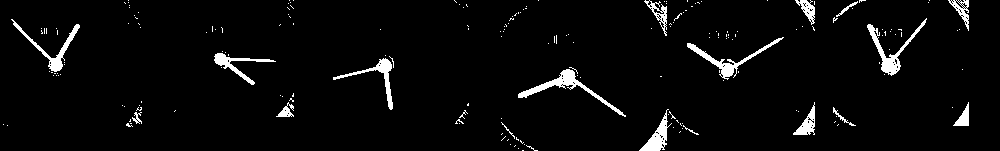

In [8]:
def diferencia(posiciones):
  max = -1
  ind = -1
  for t in range(len(posiciones)):
    tup = posiciones[t]
    aux = tup[1]-tup[0]
    if aux > max:
      max = aux
      ind = t
  return max

def recortar_img(img,pos_x, pos_y,max_N, max_M, white=False):
  I = img
  (N,M) = I.shape
  for i in range(N):
    if i < pos_x[0]:
      I[i,:] = 0.0 + 255*white 
    if (i > pos_x[0] + max_N) or i > pos_x[1] :
      I[i,:] = 0.0 + 255*white 
  for j in range(M):
    if j < pos_y[0]:
      I[:,j] = 0.0 + 255*white 
    if (j > pos_y[0] + max_M) or j > pos_y[1] :
      I[:,j] = 0.0 + 255*white 
  return I[pos_x[0]:pos_x[0]+max_N, pos_y[0]:pos_y[0]+max_M]

max_N = diferencia(posicion_x)
max_M = diferencia(posicion_y)

short_clocks = tuple(recortar_img(IMG_Rv[i],posicion_x[i], posicion_y[i], max_N, max_M) for i in range(6))
show_Short_clocks = np.concatenate(short_clocks, axis = 1)
cv2_imshow(show_Short_clocks)

Para probar, se hace lo mismo con las imágenes del canal verde y al final se decide ir por este canal, ya que se ve a simple vista que está más limpio que las imágenes del canal rojo.

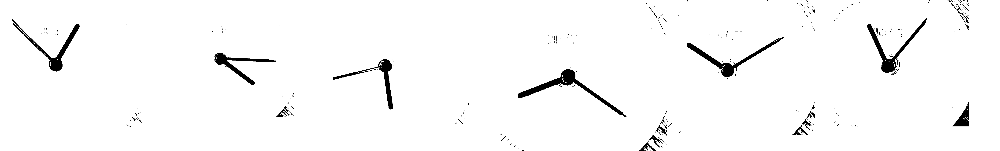

In [9]:
short_clocks_Gv = tuple(recortar_img(IMG_Gv[i],posicion_x[i], posicion_y[i], max_N, max_M, True) for i in range(6))
show_Short_clocks = np.concatenate(short_clocks_Gv, axis = 1)
cv2_imshow(show_Short_clocks)

## Obtención de manecillas
Se limpian y rellenan los espacio para obtener directamente las manecillas, o al menos lo más limpio posible. De la misma forma que se hizo con el reloj.

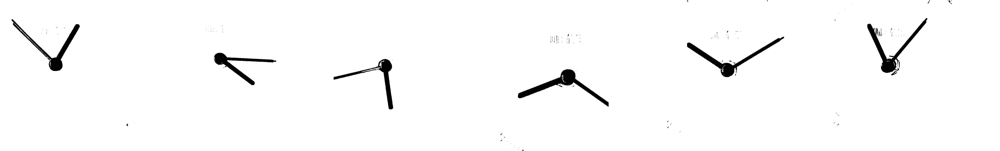

In [10]:
def rellenar_espacios(img, space=1):
  (N,M) = img.shape
  I = img
  Xm = np.zeros((N,M), np.uint8) + 255.0
  for i in range(space,N-space):
    for j in range(space, M-space):
      up = [I[i-spa,j] for spa in range(1,space+1) if i-spa >= 0].count(0.0)
      down= [I[i+spa,j] for spa in range(1,space+1) if i+spa < N-space].count(0.0)
      rigth = [I[i,j+spa] for spa in range(1,space+1) if j+spa < M-space].count(0.0)
      left = [I[i,j-spa] for spa in range(1,space+1) if j-spa >= 0].count(0.0)
      if up+down+rigth+left >= 4:
        Xm[i,j] = up
      else:
        Xm[i,j] = 255.0
  return Xm

def esquina_inferior(img):
  I = img.copy()
  (N,M) = I.shape
  i = N-1
  primer=M-1
  while i >= 0:
    if I[i,int(M/2):].tolist().count(0.0) > 0:
      primer = I[i,int(M/2):].tolist().index(0.0) + int(M/2) - 1
      break
    i-=1
  for i in range(N):
      I[i,primer:] = 255.0
  return I

Limpiar_esquina = tuple(esquina_inferior(clear_Y(short_clocks_Gv[num],5)) for num in range(6))
rellenar_Limpieza_esquina= tuple(rellenar_espacios(img,2) for img in Limpiar_esquina)
comp = np.concatenate(rellenar_Limpieza_esquina, axis = 1)
cv2_imshow(comp)

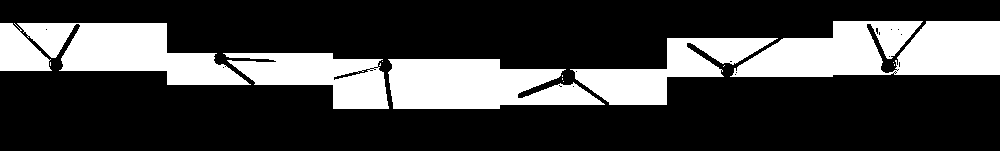

In [11]:
def contar_seguidos_max(lista):
  max = 0
  contador = 0
  for elem in lista:
    if elem < 255.0:
      contador += 1
    else:
      if contador > max:
        max = contador
      contador = 0
  return max

def clear_contorno_X(img, clear=True):
  I = img.copy()
  (N,M) = img.shape
  inicio = -1
  final = N
  for i in range(N):
    if contar_seguidos_max(I[i,:].tolist()) < 21:
      I[i,:] = 255.0*clear
      if inicio == -1:
        inicio = i
    else:
      if inicio!=-1:
        final = i
        break
  inicio = -1
  final = 0
  for i in range(N-1,0,-1):
    if contar_seguidos_max(I[i,:].tolist()) < 18:
      I[i,:] = 255.0*clear
      if inicio == -1:
        inicio = i
    else:
      if inicio!=-1:
        final = i
        break
  return I

show_manesillas_x = tuple(clear_contorno_X(img, False) for img in rellenar_Limpieza_esquina)
show_show_manesillas_x = np.concatenate(show_manesillas_x, axis=1)
cv2_imshow(show_show_manesillas_x)

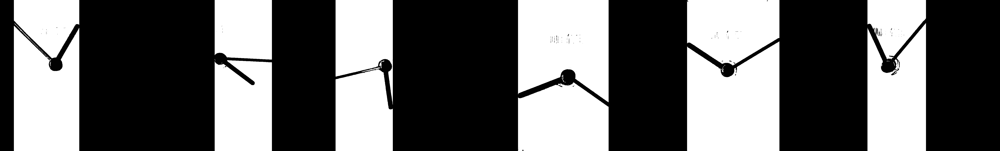

In [12]:
def clear_contorno_Y(img, clear=True):
  (N,M) = img.shape
  I = img.copy()
  inicio = -1
  final = N
  for j in range(M):
    if contar_seguidos_max(I[:,j].tolist()) < 18:
      I[:,j] = 255.0*clear
      if inicio == -1:
        inicio = j
    else:
      if inicio!=-1:
        final = j
        break

  inicio = -1
  final = 0
  for j in range(M-1,0,-1):
    if contar_seguidos_max(I[:,j].tolist()) < 18:
      I[:,j] = 255.0*clear
      if inicio == -1:
        inicio = j
    else:
      if inicio!=-1:
        final = j
        break
  return I

show_manesillas_Y = tuple(clear_contorno_Y(img, False) for img in rellenar_Limpieza_esquina)
show_show_manesillas_Y = np.concatenate(show_manesillas_Y, axis=1)
cv2_imshow(show_show_manesillas_Y)

Dejando al final este resultado.

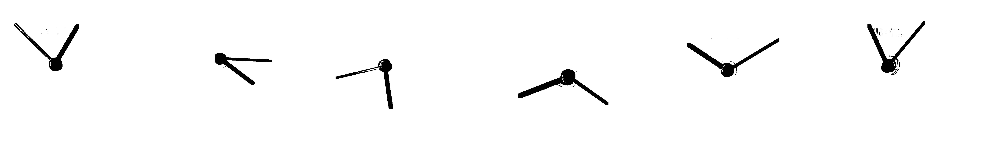

In [13]:
clear_manesillas = tuple(clear_contorno_Y(clear_contorno_X(img)) for img in rellenar_Limpieza_esquina)
show_clear_manesillas = np.concatenate(clear_manesillas, axis=1)
cv2_imshow(show_clear_manesillas)

## Obtener aproximación del centro de las manecillas

Existen muchas formas de hacerlo, en este caso, se busca la fila y columna con más pixeles negros seguidos. Lamentablemente, debido a la ubicación de algunas manecillas este no es el mejor método para hacerlo.

Otra forma pudo ser buscar el centro de la misma forma que se limpió el reloj pero esta aproximación también es buena y por falta de tiempo se dejó así.

((417, 379), (395, 329), (435, 343), (504, 427), (420, 384), (375, 310))


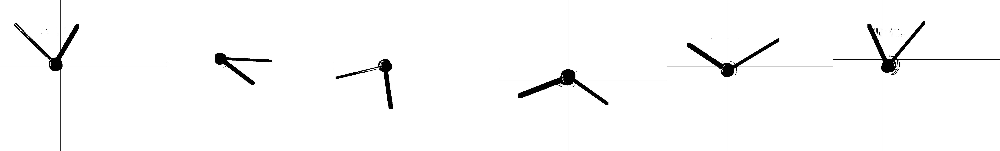

In [14]:
def encontrar_centro(img):
  (N,M) = img.shape
  I = img.copy()
  max_Y = 0
  pos_Y = -1
  for j in range(M-1,0,-1):
    current = contar_seguidos_max(img[:,j].tolist())
    if current > max_Y:
      pos_Y = j
      max_Y = current
  I[:,pos_Y] = 0.0

  max_X = 0
  pos_X = -1
  for i in range(N):
    current = contar_seguidos_max(img[i,:].tolist())
    if current > max_X and current < 87:
      pos_X = i
      max_X = current
  I[pos_X,:] = 0.0
  return I, pos_X, pos_Y

psudo_center = tuple(encontrar_centro(img)[1:] for img in clear_manesillas)
show_psudo_center = tuple(encontrar_centro(img)[0] for img in clear_manesillas)
show_show_psudo_center = np.concatenate(show_psudo_center, axis=1)
print(psudo_center)
cv2_imshow(show_show_psudo_center)

## Distinción minutero y horario

Con este "psudo centro" ahora necesitamos encontrar la recta formada por las manecillas y el eje horizontal. De esta forma y usando como divisiones de sectores los cuadrantes que deja la selección de centro, podemos aproximar la hora indicada. Pero antes, necesitamos saber cuál es el minutero y cuál el horario.

In [15]:
def distancia(x1,x2,y1,y2):
  return sqrt((x2-x1)**2 + (y2-y1)**2)

def max_cuad(img, x1,x2,y1,y2,puntos):
  I = img
  xc,yc = puntos
  max = 0
  pto = None
  for i in range(x1,x2):
    for j in range(y1,y2):
      if I[i,j] != 255.0:
        current = distancia(xc,i,yc,j)
        if current >= max:
          max = current
          pto = (i,j)
          ancho = contar_seguidos_max(img[:,j].tolist())
  return max, pto, ancho

def minutero_hora(tupla1, tupla2):
  minutero = None
  hora = None
  tup1 = tupla1[0]
  tup2 = tupla2[0]
  dif = abs(tup1[0]-tup2[0])
  if dif > 40:
    if tup1[0]>tup2[0]:
      minutero = (tup1[1], tupla1[1])
      hora = (tup2[1], tupla2[1])
    else:
      minutero = (tup2[1], tupla2[1])
      hora = (tup1[1], tupla1[1])
  else:
    if tup1[2] > tup2[2]:
      minutero = (tup2[1], tupla2[1])
      hora = (tup1[1], tupla1[1])
    else:
      minutero = (tup1[1], tupla1[1])
      hora = (tup2[1], tupla2[1])
  return minutero, hora

def exist_cuad(img, puntos):
  xc,yc = puntos
  N,M = img.shape
  c1 = max_cuad(img,0,xc,0,yc, puntos)
  c2 = max_cuad(img,0,xc,yc,M, puntos)
  c3 = max_cuad(img,xc,N,yc,M, puntos)
  c4 = max_cuad(img,xc,N,0,yc, puntos)
  orden = [(c1, 1),(c2, 2),(c3,3),(c4,4)]
  orden.sort(reverse=True)
  return minutero_hora(orden[0],orden[1])


minu_hora = tuple(exist_cuad(clear_manesillas[i], psudo_center[i]) for i in range(6))
for i in minu_hora:
  print(i)

(((146, 88), 1), ((153, 491), 2))
(((376, 659), 2), ((531, 550), 3))
(((500, 14), 4), ((688, 368), 3))
(((662, 679), 3), ((614, 113), 4))
(((242, 706), 2), ((274, 128), 1))
(((135, 574), 2), ((152, 217), 1))


Lo anterior señala la punta del minutero y el horario, en este orden, junto al sector en el que pertencen. Agradeciendo la posibilidad de dividir correctamente las manecillas en diferentes sectores.

## Ubicación y ángulo del horario

Con la punta, nos hace falta otro punto, por razones se decidió buscar el punto cuya distancia mínima sea la del centro del reloj. Sin embargo, debido a los resultados se decidió dejar el centro aproximado como el segundo punto para la recta.

Tanto la decisión de este punto como la obtención del anterior es lo que hace la diferencia al buscar traducir la imagen en una hora en específica. 

In [16]:
def min_cuad(img,x1,x2,y1,y2,puntos, card):
  I = img
  xc,yc = puntos
  min = img.shape[0]
  pto = None
  for i in range(x1,x2):
    for j in range(y1,y2):
      if card == 1 or card == 2:
        if (I[i,j] == 255.0) and (contar_seguidos_max(I[i:x2,j].tolist()) > 18) :
          current = distancia(xc,i,yc,j)
          if current < min:
            min = current
            pto = (i,j)
      else:
        if (I[i,j] == 255.0):
          current = distancia(xc,i,yc,j)
          if current < min:
            min = current
            pto = (i,j)
  return pto

def exist_min(img, puntos, cuad):
  xc,yc = puntos
  N,M = img.shape
  if cuad == 1:
    c = min_cuad(img,0,xc+1,0,yc+1, puntos,1)
  elif cuad == 2:
    c = min_cuad(img,0,xc-1,yc-1,M, puntos,2)
  elif cuad == 3:
    c = min_cuad(img,0,N,0,M, puntos,3)
  else:
    c = min_cuad(img,0,N,0,yc+1, puntos,4)
  return c

minimos_puntos_H = tuple(exist_min(clear_manesillas[i], psudo_center[i], minu_hora[i][1][1]) for i in range(6))
for i in minimos_puntos_H:
  print(i)

(312, 381)
(408, 331)
(446, 354)
(519, 411)
(400, 355)
(301, 304)


A continuación se calcula la hora según el ángulo que produce la recta encontrada anteriormente, usando como segundo punto el psudo centro calculado.

Cuadrante: 2 - Ángulo: 23 / 22.98871680208063 - Hora: 12
Cuadrante: 3 - Ángulo: 32 / 31.607502246248906 - Hora: 4
Cuadrante: 3 - Ángulo: 85 / 84.35668171946602 - Hora: 5
Cuadrante: 4 - Ángulo: 71 / 70.69369965939963 - Hora: 8
Cuadrante: 1 - Ángulo: 30 / 29.696652537699055 - Hora: 10
Cuadrante: 1 - Ángulo: 68 / 67.36189379835332 - Hora: 11


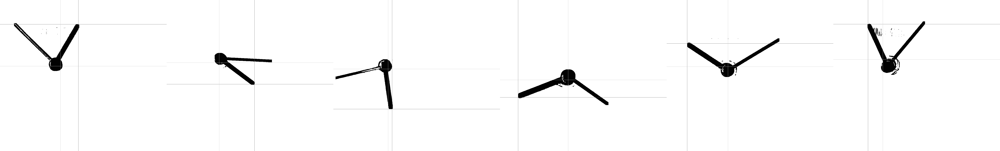

In [18]:
def grad_to_hour(ang,cuad,err=0):
  ang = ang
  if cuad == 2:
    if ang <= 30:
      return 12
    elif ang <= 60:
      return 1
    else:
      return 2
  elif cuad == 3:
    if ang < 30:
      return 3
    elif ang <= 60:
      return 4
    else:
      return 5
  elif cuad == 4:
    if ang < 30:
      return 6
    elif ang <= 60:
      return 7
    else:
      return 8
  elif cuad == 1:
    if 90-ang <= 30:
        return 11
    elif 90-ang <= 60:
      return 10
    else:
      return 9
  else:
    return None

def show_horero(img, pto, pto_min, imprimir=False):
  I = img.copy()
  i,j = pto[1][0]
  i2,j2 = pto_min
  cuad = pto[1][1]
  I[i,:] = 100
  I[:,j] = 100
  I[i2,:] = 200
  I[:,j2] = 200
  y = abs(i-i2)
  x = abs(j-j2)
  if cuad == 2:
    ang = 90 - (np.arctan(y/x)*180)/pi
  elif cuad == 4: 
    ang = 90 - (np.arctan(y/x)*180)/pi
  elif cuad == 3:
    ang = (np.arctan(y/x)*180)/pi
  else:
    ang = (np.arctan(y/x)*180)/pi
  if imprimir:
    print("Cuadrante:", cuad, "- Ángulo:",ceil(ang),"/",ang,"- Hora:",grad_to_hour(ceil(ang),cuad))
  return I, (ang, cuad, grad_to_hour(ceil(ang),cuad))

angulos_horero = tuple(show_horero(clear_manesillas[i], minu_hora[i], psudo_center[i], True)[1] for i in range(6))
show_manecilla_h = tuple(show_horero(clear_manesillas[i], minu_hora[i], psudo_center[i])[0] for i in range(6))
conca = np.concatenate(show_manecilla_h, axis=1)
cv2_imshow(conca)

## Cálculo de hora

Este paso requiere una abstraerse del problema y pensar matemáticamente en el cómo funciona un reloj. 

Empezamos por el cómo se calculó el ángulo de la hora, utilizando el arcotangente de la pendiente que se forma entre la recta del horario y el eje horizontal de cualquier plano. Al ser una medida adimensional permite poder calcular el avance del minutero sin necesidad de calcular más rectas.

De esta forma, llegamos a darnos cuenta de que el avance en grados del minutero es doce veces el del horario (*M=12H*), y que de la misma forma que 1 hora se traduce a 30°, cada minuto corresponden a 6°. Entonces, el cálculo base que se debe realizar es:

AvanceMinutero = (12 x AvanceHorario - 360 x HorasTranscurridas)/6

De esta forma, solo queda considerar los diferentes casos que ocurren entre las diferentes secciones por las cuales se dividió el reloj. Es por esto que los ángulos anteriores son entre 0 y 90 grados.


In [19]:
def cantHoras(angH, cardH):
  if cardH == 2:
    horas = int((12*ceil(angH))/360)
  elif cardH == 3:
    horas = int((ceil(angH+90)*12)/360)
  elif cardH == 4:
    horas = int((ceil(angH+180)*12)/360)
  elif cardH == 1:
    horas = int((ceil(angH+270)*12)/360)
  return horas

def mov_H(angH, cardH):
  if cardH == 2:
    return angH
  elif cardH == 3:
    return angH+90
  elif cardH == 4:
    return angH+180
  else:
    return  90-angH

def calcular_minutos(tupM, tupH):
  punto = tupM[0][0]
  cardM = tupM[0][1]
  angH, cardH = tupH[0], tupH[1]
  horas = cantHoras(angH, cardH)
  if cardM == 1:
    minutos_rev = round(((12*mov_H(angH, cardH)) - 360*horas)//6)
  elif cardM == 2:
    if cardH == 1:
      minutos_rev = round(mov_H(angH, cardH)/6)
    else:
      minutos_rev = round((90 + mov_H(angH, cardH)*12 - 360*horas)/6)
  elif cardM == 3:
    minutos_rev = round(((12*(mov_H(angH, cardH)) - 360*horas))/6)
  elif cardM == 4:
    minutos_rev = (round((mov_H(angH, cardH)))*12 - 360*horas)//6
  else:
    minutos_rev = None
  return minutos_rev

for i in range(6):
  res = calcular_minutos(minu_hora[i], angulos_horero[i])
  print("reloj",i, "- Hora", angulos_horero[i][-1], ":", res)
  print("------------------")

reloj 0 - Hora 12 : 45
------------------
reloj 1 - Hora 4 : 18
------------------
reloj 2 - Hora 5 : 48
------------------
reloj 3 - Hora 8 : 21
------------------
reloj 4 - Hora 10 : 10
------------------
reloj 5 - Hora 11 : 4
------------------


# Todo en uno

Como se mencionó antes, en caso de que deseen correr el código por si mismos, pueden ejecutar los siguientes *code boxs*. 

El tiempo de ejecución promedio es de 10 minutos para todas las imágenes. 

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from cv2 import imread
from google.colab.patches import cv2_imshow
from math import sqrt, ceil, floor, pi, modf

# Funciones a utilizar

def canalSel(img,i):
  copia = img.copy() 
  return copia[:,:,i]

def segmenta(img, t): # Función de segmentación entregada por el profesor
  (N,M) = img.shape
  Y = np.zeros((N,M))
  for i in range(N):
    for j in range(M):
      if img[i,j] > t:
        Y[i,j] = 255
  return Y

def voltear(X): # Voltea el valor de los todos los pixeles de la imágen
  (N,M) = X.shape
  Xm = np.zeros((N,M), np.uint8)
  for j in range(M):
    for i in range(N):
      Xm[i,j] = 255 - X[i,j]
  return Xm

def clear_Y(I,minimo, inv=0): # Limpia columnas que no cumplan con el mínimo valor de pixeles negros
  Img = I
  (N,M) = Img.shape
  for j in range(M):
    cant = Img[:,j].tolist().count(0.0)
    if cant < minimo:
      if inv == 0:
        Img[:,j] = 255.0
      else:
        Img[:,j] = 0.0
  return Img

def clear_X(I, minimo, inv=0): # Limpia filas que no cumplan con el mínimo valor de pixeles negros
  Img = I
  (N,M) = Img.shape
  for i in range(N):
    cant = Img[i,:].tolist().count(0.0)
    if cant < minimo:
      if inv == 0:
        Img[i,:] = 255.0
      else:
        Img[i,:] = 0.0
  return Img

def clear_all(I, minimo): # Limpia filas y columnas que no cumplan con el mínimo valor de pixeles negros
  Img = I
  (N,M) = Img.shape
  Img = clear_X(Img, minimo)
  Img = clear_Y(Img, minimo)
  return Img

def ident_reloj_X(img): 
  I = img.copy()
  (N,M) = img.shape
  inicio = -1
  final = N
  for i in range(N-3):
    if I[i,:].tolist().count(0.0)+I[i+1,:].tolist().count(0.0)+I[i+2,:].tolist().count(0.0) > 10:
      I[i,:] = 0.0
      if inicio == -1:
        inicio = i
    else:
      if inicio!=-1:
        final = i
        break
  return inicio, final

def ident_reloj_Y(img):
  I = img.copy()
  (N,M) = img.shape
  inicio = -1
  final = -1
  for j in range(M-3):
    if I[:,j].tolist().count(0.0) + I[:,j+1].tolist().count(0.0) + I[:,j+2].tolist().count(0.0) > 10:
      I[:,j] = 0.0
      if inicio == -1:
        inicio = j
    else:
      if inicio!=-1:
        final = j
        break
  return inicio, final

def recortar_img(img,pos_x, pos_y):
  return img[pos_x[0]:pos_x[1], pos_y[0]:pos_y[1]]

def rellenar_espacios(img, space=1):
  (N,M) = img.shape
  I = img
  Xm = np.zeros((N,M), np.uint8) + 255.0
  for i in range(space,N-space):
    for j in range(space, M-space):
      up = [I[i-spa,j] for spa in range(1,space+1) if i-spa >= 0].count(0.0)
      down= [I[i+spa,j] for spa in range(1,space+1) if i+spa < N-space].count(0.0)
      rigth = [I[i,j+spa] for spa in range(1,space+1) if j+spa < M-space].count(0.0)
      left = [I[i,j-spa] for spa in range(1,space+1) if j-spa >= 0].count(0.0)
      if up+down+rigth+left >= 4:
        Xm[i,j] = up
      else:
        Xm[i,j] = 255.0
  return Xm

def esquina_inferior(img):
  I = img.copy()
  (N,M) = I.shape
  i = N-1
  primer=M-1
  while i >= 0:
    if I[i,int(M/2):].tolist().count(0.0) > 0:
      primer = I[i,int(M/2):].tolist().index(0.0) + int(M/2) - 1
      break
    i-=1
  for i in range(N):
      I[i,primer:] = 255.0
  return I

def contar_seguidos_max(lista):
  max = 0
  contador = 0
  for elem in lista:
    if elem < 255.0:
      contador += 1
    else:
      if contador > max:
        max = contador
      contador = 0
  return max

def clear_contorno_X(img, clear=True):
  I = img.copy()
  (N,M) = img.shape
  inicio = -1
  final = N
  for i in range(N):
    if contar_seguidos_max(I[i,:].tolist()) < 21:
      I[i,:] = 255.0*clear
      if inicio == -1:
        inicio = i
    else:
      if inicio!=-1:
        final = i
        break
  inicio = -1
  final = 0
  for i in range(N-1,0,-1):
    if contar_seguidos_max(I[i,:].tolist()) < 18:
      I[i,:] = 255.0*clear
      if inicio == -1:
        inicio = i
    else:
      if inicio!=-1:
        final = i
        break
  return I

def clear_contorno_Y(img, clear=True):
  (N,M) = img.shape
  I = img.copy()
  inicio = -1
  final = N
  for j in range(M):
    if contar_seguidos_max(I[:,j].tolist()) < 18:
      I[:,j] = 255.0*clear
      if inicio == -1:
        inicio = j
    else:
      if inicio!=-1:
        final = j
        break
  inicio = -1
  final = 0
  for j in range(M-1,0,-1):
    if contar_seguidos_max(I[:,j].tolist()) < 18:
      I[:,j] = 255.0*clear
      if inicio == -1:
        inicio = j
    else:
      if inicio!=-1:
        final = j
        break
  return I

def encontrar_centro(img):
  (N,M) = img.shape
  I = img.copy()
  max_Y = 0
  pos_Y = -1
  for j in range(M-1,0,-1):
    current = contar_seguidos_max(img[:,j].tolist())
    if current > max_Y:
      pos_Y = j
      max_Y = current
  I[:,pos_Y] = 0.0

  max_X = 0
  pos_X = -1
  for i in range(N):
    current = contar_seguidos_max(img[i,:].tolist())
    if current > max_X and current < 87:
      pos_X = i
      max_X = current
  I[pos_X,:] = 0.0
  return pos_X, pos_Y

def distancia(x1,x2,y1,y2):
  return sqrt((x2-x1)**2 + (y2-y1)**2)

def max_cuad(img, x1,x2,y1,y2,puntos):
  I = img
  xc,yc = puntos
  max = 0
  pto = None
  for i in range(x1,x2):
    for j in range(y1,y2):
      if I[i,j] != 255.0:
        current = distancia(xc,i,yc,j)
        if current >= max:
          max = current
          pto = (i,j)
          ancho = contar_seguidos_max(img[:,j].tolist())
  return max, pto, ancho

def minutero_hora(tupla1, tupla2):
  minutero = None
  hora = None
  tup1 = tupla1[0]
  tup2 = tupla2[0]
  dif = abs(tup1[0]-tup2[0])
  if dif > 40:
    if tup1[0]>tup2[0]:
      minutero = (tup1[1], tupla1[1])
      hora = (tup2[1], tupla2[1])
    else:
      minutero = (tup2[1], tupla2[1])
      hora = (tup1[1], tupla1[1])
  else:
    if tup1[2] > tup2[2]:
      minutero = (tup2[1], tupla2[1])
      hora = (tup1[1], tupla1[1])
    else:
      minutero = (tup1[1], tupla1[1])
      hora = (tup2[1], tupla2[1])
  return minutero, hora

def exist_cuad(img, puntos):
  xc,yc = puntos
  N,M = img.shape
  c1 = max_cuad(img,0,xc,0,yc, puntos)
  c2 = max_cuad(img,0,xc,yc,M, puntos)
  c3 = max_cuad(img,xc,N,yc,M, puntos)
  c4 = max_cuad(img,xc,N,0,yc, puntos)
  orden = [(c1, 1),(c2, 2),(c3,3),(c4,4)]
  orden.sort(reverse=True)
  return minutero_hora(orden[0],orden[1])

def min_cuad(img,x1,x2,y1,y2,puntos, card):
  I = img
  xc,yc = puntos
  min = img.shape[0]
  pto = None
  for i in range(x1,x2):
    for j in range(y1,y2):
      if card == 1 or card == 2:
        if (I[i,j] == 255.0) and (contar_seguidos_max(I[i:x2,j].tolist()) > 18) :
          current = distancia(xc,i,yc,j)
          if current < min:
            min = current
            pto = (i,j)
      else:
        if (I[i,j] == 255.0):
          current = distancia(xc,i,yc,j)
          if current < min:
            min = current
            pto = (i,j)
  return pto

def exist_min(img, puntos, cuad):
  xc,yc = puntos
  N,M = img.shape
  if cuad == 1:
    c = min_cuad(img,0,xc+1,0,yc+1, puntos,1)
  elif cuad == 2:
    c = min_cuad(img,0,xc-1,yc-1,M, puntos,2)
  elif cuad == 3:
    c = min_cuad(img,0,N,0,M, puntos,3)
  else:
    c = min_cuad(img,0,N,0,yc+1, puntos,4)
  return c

def grad_to_hour(ang,cuad,err=0):
  ang = ang
  if cuad == 2:
    if ang <= 30:
      return 12
    elif ang <= 60:
      return 1
    else:
      return 2
  elif cuad == 3:
    if ang < 30:
      return 3
    elif ang <= 60:
      return 4
    else:
      return 5
  elif cuad == 4:
    if ang < 30:
      return 6
    elif ang <= 60:
      return 7
    else:
      return 8
  elif cuad == 1:
    if 90-ang <= 30: # se da vuelta la medida del ángulo
        return 11
    elif 90-ang <= 60:
      return 10
    else:
      return 9
  else:
    return None

def show_horero(img, pto, pto_min):
  I = img.copy()
  i,j = pto[1][0]
  i2,j2 = pto_min
  cuad = pto[1][1]
  I[i,:] = 100
  I[:,j] = 100
  I[i2,:] = 200
  I[:,j2] = 200
  y = abs(i-i2)
  x = abs(j-j2)
  if cuad == 2:
    ang = 90 - (np.arctan(y/x)*180)/pi
  elif cuad == 4: 
    ang = 90 - (np.arctan(y/x)*180)/pi
  elif cuad == 3:
    ang = (np.arctan(y/x)*180)/pi
  else:
    ang = (np.arctan(y/x)*180)/pi
  return (ang, cuad, grad_to_hour(ceil(ang),cuad))

def cantHoras(angH, cardH):
  if cardH == 2:
    horas = int((12*ceil(angH))/360)
  elif cardH == 3:
    horas = int((ceil(angH+90)*12)/360)
  elif cardH == 4:
    horas = int((ceil(angH+180)*12)/360)
  elif cardH == 1:
    horas = int((ceil(angH+270)*12)/360)
  return horas

def mov_H(angH, cardH):
  if cardH == 2:
    return angH
  elif cardH == 3:
    return angH+90
  elif cardH == 4:
    return angH+180
  else:
    return  90-angH

def calcular_minutos(tupM, tupH):
  punto = tupM[0][0]
  cardM = tupM[0][1]
  angH, cardH = tupH[0], tupH[1]
  horas = cantHoras(angH, cardH)
  if cardM == 1:
    minutos_rev = round((modf((12*mov_H(angH, cardH)) - 360*horas)[1]//6))
  elif cardM == 2:
    if cardH == 1:
      minutos_rev = round(mov_H(angH, cardH)/6)
    else:
      minutos_rev = round((90 + mov_H(angH, cardH)*12 - 360*horas)/6)
  elif cardM == 3:
    minutos_rev = round(((12*(mov_H(angH, cardH)) - 360*horas))/6)
  elif cardM == 4:
    minutos_rev = (round((mov_H(angH, cardH)))*12 - 360*horas)//6
  else:
    minutos_rev = None 
  return minutos_rev

# Main Function
def whatTimeIs(img):
  # Separacion de canales
  img_c1 = canalSel(img, 1) # G
  img_c0 = canalSel(img, 0) # B
  
  # Segmentacion de canales
  Gv = segmenta(img_c1, 40) 
  Bv = segmenta(voltear(img_c0),75)
  
  # Limpieza canal azul
  Clear_aux1 =  clear_all(Bv, 340)
  Clear_aux2 = clear_Y(Clear_aux1, 400)
  Clear_img = clear_X(Clear_aux2, 340)
  
  posicion_x = ident_reloj_X(Clear_img)
  posicion_y = ident_reloj_Y(Clear_img)

  shortClock = recortar_img(Gv,posicion_x, posicion_y)
  clear_shortClock = rellenar_espacios(esquina_inferior(clear_Y(shortClock,5)),2)
  manecillas = clear_contorno_Y(clear_contorno_X(clear_shortClock))
  
  psudoCenter = encontrar_centro(manecillas)
  minu_hora = exist_cuad(manecillas, psudoCenter)

  angulos_horero = show_horero(manecillas, minu_hora, psudoCenter)

  res = calcular_minutos(minu_hora, angulos_horero)
  print("- Hora", angulos_horero[-1], ":", res)


In [22]:
clockFiles = [imread('IMG_649{}.jpg'.format(i)) for i in range(6)]
for i in range(6):
  print("IMG_649{}.jpg:".format(i))
  whatTimeIs(clockFiles[i])

IMG_6490.jpg:
- Hora 12 : 45
IMG_6491.jpg:
- Hora 4 : 18
IMG_6492.jpg:
- Hora 5 : 48
IMG_6493.jpg:
- Hora 8 : 21
IMG_6494.jpg:
- Hora 10 : 10
IMG_6495.jpg:
- Hora 11 : 4
